### Import libs

In [185]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import scikitplot as skplt
from plotly.subplots import make_subplots

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
import matplotlib.pyplot as plt

from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier


from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedStratifiedKFold


import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

### 1. Business understanding

In [186]:
# Prediting the resignation of staff is necessary to retain good staff effectively
# It is more efficiently than recruiting new staff
# The company is building a model to understand its staff: reason the resignation of staff or willing to stay
# From analyzing historical data, the company will take action accordingly

### 2 Data understanding

In [187]:
# load dataset
df=pd.read_csv("hr_dataset.csv")
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


In [188]:
# Exploring data
print("Shape: ", df.shape)
print(df.info()) 

Shape:  (14999, 10)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   Department             14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB
None


### 3. Data Cleaning

#### 3.1 Check null Data and remove if any

In [189]:
df.isnull()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
14994,False,False,False,False,False,False,False,False,False,False
14995,False,False,False,False,False,False,False,False,False,False
14996,False,False,False,False,False,False,False,False,False,False
14997,False,False,False,False,False,False,False,False,False,False


In [190]:
df.isna().sum()



satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
Department               0
salary                   0
dtype: int64

#### 3.2 Check outlier

In [191]:
# check outlier

def check_outlier(data, col):
    q1=data[col].quantile(0.25, interpolation="nearest")
    q3=data[col].quantile(0.75, interpolation="nearest")
    IQR =q3-q1
    lower_edge = q1 - 1.5*IQR
    upper_edge = q3 + 1.5*IQR

    if data[col].min() > lower_edge and data[col].max() > upper_edge:
        print(f"No outlier found for {col} ")
    else:
         print("Exists some outliers")
         x = data[data[col]< lower_edge].size
         y = data[data[col]> upper_edge].size
         print(f"Number of outliers is in {col}: {x + y}")

cols = ["satisfaction_level", "last_evaluation"]
for col in cols:
    check_outlier(df, col)

Exists some outliers
Number of outliers is in satisfaction_level: 0
Exists some outliers
Number of outliers is in last_evaluation: 0


In [192]:
# check unique values
print(" - Working/Left: ", df["left"].unique())
print(" - List of Deptment: ",df["Department"].unique())
print(" - Salary level: ", df["salary"].unique())

 - Working/Left:  [1 0]
 - List of Deptment:  ['sales' 'accounting' 'hr' 'technical' 'support' 'management' 'IT'
 'product_mng' 'marketing' 'RandD']
 - Salary level:  ['low' 'medium' 'high']


### 4 Exporatory Data

#### 4.1 Salary features

In [193]:
# How many staff in each salary level: low, medium, high

df["salary"].value_counts().to_frame().style.background_gradient(cmap="plasma_r")

,salary
low,7316
medium,6446
high,1237


In [194]:
# display on bar abd pie chart
labels = ["low", "medium", "high"]

fig = make_subplots(rows=1, cols=2, specs=[[{"type":"bar"}, {"type":"pie"}]])

fig.add_trace(
    go.Bar(
        x=labels,
        y= df["salary"].value_counts(),
        marker_color = ["olive", "blue", "red"],
        showlegend=True,
        text=df["salary"].value_counts(),
        textposition='auto'
    ),
    row=1, col=1
)

fig.append_trace(
    go.Pie(
        labels=labels,
        values=df["salary"].value_counts().to_list(),
        hole=0.3,
        marker =dict(colors=["olive", "blue", "red"])
    ),
     row=1, col=2
)

fig.update_layout(
    height=600,
    width=1200,
    title="Compare number of salary level in dataset",
    margin=dict(t=40,l=20,r=20, b=20),
    plot_bgcolor= 'rgba(0,0,0,0)'
)
fig.show()

#### 4.2 Explore Numeric features

##### 4.2.1 Satisfication feature

In [195]:
fig=px.violin(
    df,
    y="satisfaction_level",
    box=True,
    points="all",
    labels={"Satisfaction Level":"satisfaction_level"}
)
fig.show()

##### 4.2.2 Average Working hour monthly feature

In [196]:
fig=px.violin(
    df,
    y="average_montly_hours",
    box=True,
    points="all",
    labels={"Satisfaction Level":"satisfaction_level"}
)
fig.show()

#### 4.3 Analysic affecting of demographic info to leave determination

##### 4.3.1 Salary vs Leaving

In [197]:
# select new data
df_stl = df[["salary", "left"]]

df_stl=df_stl.groupby("salary")["left"].value_counts()
df_stl = df_stl.unstack()
df_stl.style.background_gradient(cmap="plasma_r")

left,0,1
salary,,
high,1155,82
low,5144,2172
medium,5129,1317


In [198]:
# draw sunburst chart
fig=px.sunburst(
    data_frame=df,
    path=["salary", "left"],
    color="left",
    title ="Salary vs Leaving determination"
)

fig.update_traces(
    textinfo="label+percent parent"
)

fig.update_layout(
    margin=dict(t=40, l=0,r=0, b=0)
)

fig.show()

##### 4.3.2 Promotion vs Leaving

In [199]:
# draw sunburst chart
fig=px.sunburst(
    data_frame=df,
    path=["promotion_last_5years", "left"],
    color="left",
    title ="Promotion vs Leaving determination"
)

fig.update_traces(
    textinfo="label+percent parent"
)

fig.update_layout(
    margin=dict(t=40, l=0,r=0, b=0)
)

fig.show()


##### 4.3.3 Time_spend_company vs Leaving

In [200]:
# draw sunburst chart
fig=px.sunburst(
    data_frame=df,
    path=["time_spend_company", "left"],
    color="left",
    title ="Promotion vs Leaving determination"
)

fig.update_traces(
    textinfo="label+percent parent"
)

fig.update_layout(
    margin=dict(t=40, l=0,r=0, b=0)
)

fig.show()

### 5. Feature Engineering

In [201]:
# backup data 
df_trans = df.copy()

##### 5.1 Normalization data


In [202]:
standard_cols =["average_montly_hours"]
scaler_std= StandardScaler()
scaler_std.fit(df_trans[standard_cols])
df_trans[standard_cols] =scaler_std.transform(df_trans[standard_cols])

#### 5.2 Using OrdinalEncoder to transform categorical values

In [203]:
enc = OrdinalEncoder()
df[["Department","salary"]] = enc.fit_transform(df[["Department","salary"]])

#### 5.3 One hot Encoding

In [204]:
one_hot_enc_cols = ['satisfaction_level',
 'last_evaluation',
 'number_project',
 'average_montly_hours',
 'time_spend_company',
 'Work_accident',
 'promotion_last_5years',
 'Department',
 'salary']
df_trans =pd.get_dummies(df_trans, columns= one_hot_enc_cols)



In [205]:
df_trans.columns

Index(['left', 'satisfaction_level_0.09', 'satisfaction_level_0.1',
       'satisfaction_level_0.11', 'satisfaction_level_0.12',
       'satisfaction_level_0.13', 'satisfaction_level_0.14',
       'satisfaction_level_0.15', 'satisfaction_level_0.16',
       'satisfaction_level_0.17',
       ...
       'Department_hr', 'Department_management', 'Department_marketing',
       'Department_product_mng', 'Department_sales', 'Department_support',
       'Department_technical', 'salary_high', 'salary_low', 'salary_medium'],
      dtype='object', length=404)

#### 5.4 Split data into train & test set

In [206]:
X= df_trans.drop(["left"], axis=1)
y= df_trans["left"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1 )

### 6 Train ML_Model

#### 6.1 KNN Model

In [207]:
knn= KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [208]:
pred=knn.predict(X_test)
print(round(accuracy_score(y_test, pred),3))

0.932


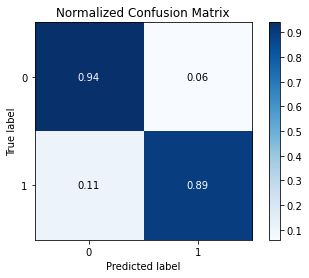

In [209]:
# Normalized confusion matrix for the K-NN model
# https://www.oreilly.com/library/view/machine-learning-with/9781789343700/23007d97-55d3-4427-b5a4-88a0322320e4.xhtml

prediction_labels = knn.predict(X_test)
skplt.metrics.plot_confusion_matrix(y_test, prediction_labels, normalize=True)

plt.show()


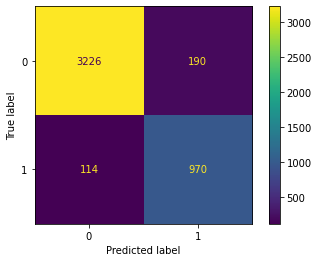

In [210]:
cm=confusion_matrix(y_test, pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

#### 6.2 Logistic Regression Model

##### 6.2.1 Train model

In [211]:
# declare an object model
lgr_ml = LogisticRegression(solver='lbfgs')

# train model
lgr_ml.fit(X_train, y_train)

c:\Users\hoang\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

##### 6.2.2 Evalute Model

In [212]:
# Use accuracy, precision, and recall method
# predict on test set
y_pred = lgr_ml.predict(X_test) 

# accuracy score
acc = metrics.accuracy_score(y_test, y_pred)
print(f"Model accuracy score: {acc}")

# accuracy score
pres = metrics.precision_score(y_test, y_pred)
print(f"Model precision score: {pres}")

# recall score
rec = metrics.recall_score(y_test, y_pred)
print(f"Model recall score: {rec}")

Model accuracy score: 0.958
Model precision score: 0.9217719132893497
Model recall score: 0.9022140221402214


##### 6.2.3 Visualizing Confusion Matrix using Heatmap

In [213]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[3333,   83],
       [ 106,  978]], dtype=int64)

Text(0.5, 257.44, 'Predicted label')

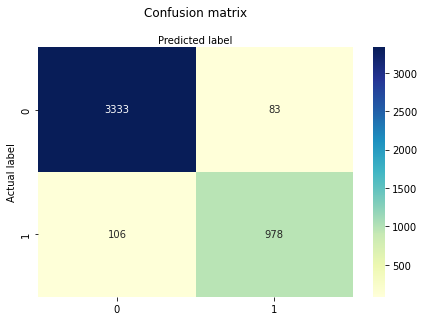

In [214]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

##### 6.2.4 ROC Curve

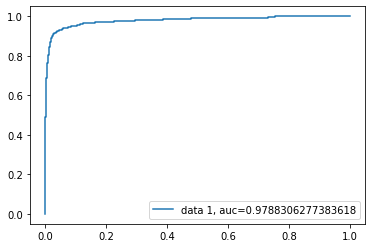

In [215]:
y_pred_proba = lgr_ml.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#### 6.3 Decision Tree Model

##### 6.3.1 Train model

In [216]:
# Create Decision Tree classifer object
dtc = DecisionTreeClassifier(max_depth=4, criterion='entropy', max_features=0.6, splitter='best')
# Train Decision Tree Classifer
dtc = dtc.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = dtc.predict(X_test)

##### 6.3.2 Evalute model

###### a. Accuracy method

In [217]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8351111111111111


###### b. Crosss validation method

In [218]:
# declare object 

dtc = DecisionTreeClassifier(max_depth=4, criterion='entropy', max_features=0.6, splitter='best')

# define the model evaluation procedure
cv=KFold(n_splits=3, shuffle=True, random_state=1)

# evalue model
result = cross_val_score(dtc, X, y, cv=cv, scoring="accuracy")

print(f"Crosss validation Accuracy: {result.mean()}")

Crosss validation Accuracy: 0.8523240648129625


###### c. Repeat cross_validation method

In [219]:
# declare object 
dtc = DecisionTreeClassifier(max_depth=4, criterion='entropy', max_features=0.6, splitter='best')


# define the model evaluation procedure
cv= RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)

# evaluate model
scores = cross_val_score(dtc, X, y, scoring='accuracy', cv=cv, n_jobs=-1)

print(f"Repeat Cross validation accuracy: {scores.mean()}")


Repeat Cross validation accuracy: 0.8753480296059211


In [220]:
feature_cols=list(X_train.columns)



##### 6.3.3 Visualizing Decision Trees

###### a. Not yet optimized

In [221]:
# RE-Train model
dtc = DecisionTreeClassifier()
# Train Decision Tree Classifer
dtc = dtc.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = dtc.predict(X_test)

In [222]:
# Visualize model
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree1.png')
Image(graph.create_png())

###### b. Optimized Decision Tree Performance

In [223]:
# Retrain model
dtc = DecisionTreeClassifier(max_depth=4, criterion='entropy', max_features=0.6, splitter='best')

# Train Decision Tree Classifer
dtc = dtc.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = dtc.predict(X_test)

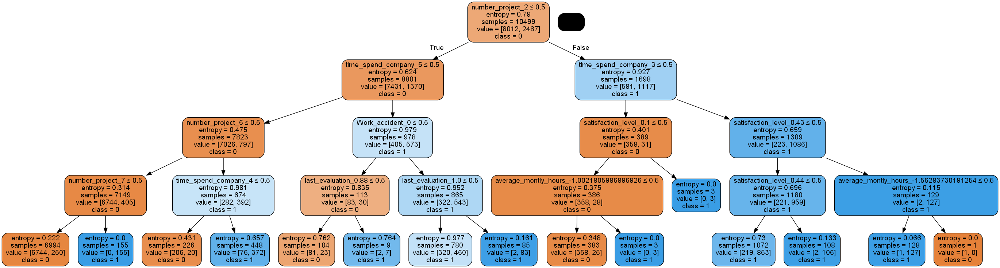

In [224]:
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree2.png')
Image(graph.create_png())

### 7. Extra reference: Decision Tree Model with Prima-indians-diabetes.csv (no encoding)

#### 7.1 prepare data

In [225]:
col_names = ['pregnant', 'glucose', 'bp', 'skin', 'insulin', 'bmi', 'pedigree', 'age', 'label']
# load dataset
pima = pd.read_csv("pima-indians-diabetes.csv", header=None, names=col_names)
#split dataset in features and target variable
feature_cols = ['pregnant', 'insulin', 'bmi', 'age','glucose','bp','pedigree']
X = pima[feature_cols] # Features
y = pima.label # Target variable
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

#### 7.2 Not yet optimized model

In [226]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

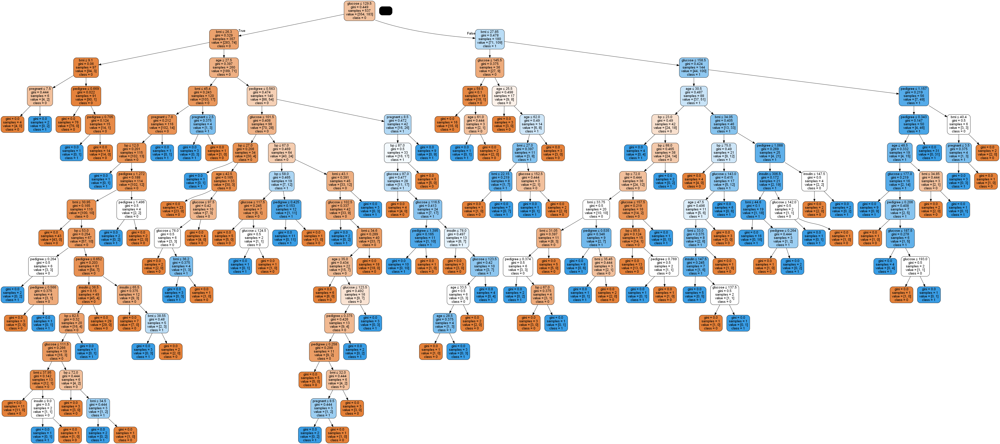

In [227]:
# Visualize
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes1.png')
Image(graph.create_png())

#### 7.3 Already optimized model

In [228]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7705627705627706


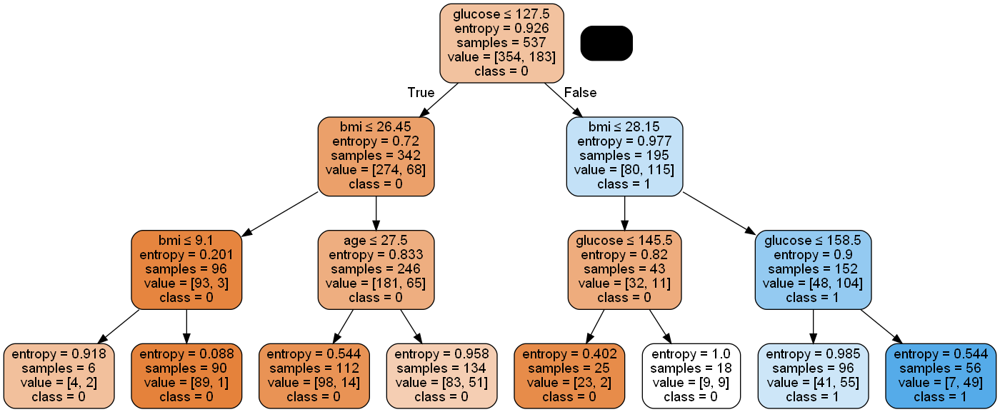

In [229]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes2.png')
Image(graph.create_png())